# **Test Task (Borys Melnychuk)**

Downloading the library that provide us pretrained UNet

In [1]:
!pip install git+https://github.com/qubvel/segmentation_models.pytorch

  Cloning https://github.com/qubvel/segmentation_models.pytorch to /tmp/pip-req-build-cekm8dmk
  Running command git clone --filter=blob:none --quiet https://github.com/qubvel/segmentation_models.pytorch /tmp/pip-req-build-cekm8dmk
  Resolved https://github.com/qubvel/segmentation_models.pytorch to commit d7a3eb0e6f55b610c2d41cce53e4c15b8f7d0ea3
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 2.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 51.1 MB/s eta 0:00:0000:01
  Created wheel for segmentation_models_pytorch: filename=segmentation_models_pytorch-0.3.4.dev0-py3-none-any.whl size=109566 sha256=5be43a64f434f304a17abde54d112703bb6ad66022dc6204028f2058f8d1

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms.v2 as T
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
import segmentation_models_pytorch as smp

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from skimage.morphology import binary_opening, disk
from skimage.measure import label, regionprops
import seaborn as sns
import cv2
from tqdm import tqdm

import os
from pathlib import Path
from datetime import datetime
import json
import random

In [3]:
# Assigning some constants
UNET_IMG_SIZE = 256
IMG_SIZE = 768
IMG_CHANNELS = 3

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

ROOT_DIR = '/kaggle/input/airbus-ship-detection'
SEGMENTATION_FILENAME = os.path.join(ROOT_DIR, 'train_ship_segmentations_v2.csv')
TRAIN_DIR = os.path.join(ROOT_DIR, 'train_v2')
TEST_DIR = os.path.join(ROOT_DIR, 'test_v2')

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [4]:
seg_df = pd.read_csv(SEGMENTATION_FILENAME)
seg_df.head()

,ImageId,EncodedPixels
0,00003e153.jpg,NaN
1,0001124c7.jpg,NaN
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...


In [5]:
# Creating dataset with and without the ships. This will help us in EDA
noships_df = seg_df[seg_df['EncodedPixels'].isna()]

ships_df = seg_df[~seg_df['EncodedPixels'].isna()].reset_index(drop=True)
ships_df = ships_df.groupby(['ImageId']).agg({'EncodedPixels': ' '.join}).reset_index()

unique_ships = ships_df['ImageId'].unique().tolist()

Our masks are encoded in run-length format so we need the function to decode and encode this

In [6]:
def rle_decode(mask_rle, shape=(IMG_SIZE, IMG_SIZE)):   # (height,width) 
    '''
    mask_rle: run-length as string formated (start length)
    shape: (height,width) of array to return 
    Returns numpy array, 1 - mask, 0 - background
    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape).T

In [7]:
def rle_encode(img):
    '''
    img: numpy array, 1 - mask, 0 - background
    Returns run length as string formated
    '''
    pixels = img.T.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

def multi_rle_encode(img):
    labels = label(img)
    return [rle_encode(labels==k) for k in np.unique(labels[labels>0])]

# **EDA**

Text(0.5, 1.0, 'Bar plot of of train and test data')

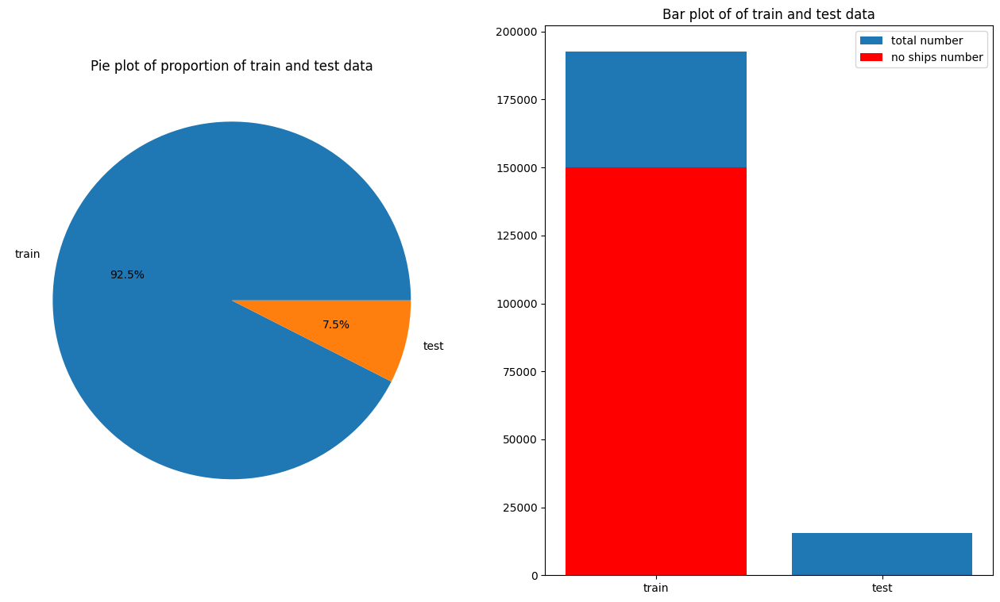

In [8]:
pie_df = pd.DataFrame({
    'type': ['train', 'test'],
    'count': [len(os.listdir(TRAIN_DIR)), len(os.listdir(TEST_DIR))]
})

fig, axes = plt.subplots(1, 2, figsize=(16, 9))

noships_num = seg_df[seg_df['EncodedPixels'].isna()]['ImageId'].nunique()

axes[0].pie(pie_df['count'], labels=pie_df['type'], autopct='%1.1f%%')
axes[0].set_title('Pie plot of proportion of train and test data')

axes[1].bar(x=pie_df['type'], height=pie_df['count'], label='total number')
axes[1].bar(x=['train'], height=[noships_num], color='r', label='no ships number')
axes[1].legend()
axes[1].set_title('Bar plot of of train and test data')

We are dealing with highly imbalanced dataset. 77% of our images don't contain any ships. So we will be training only using images that contain ships

In [10]:
np.random.seed(42)

unique_img_ids = seg_df[~seg_df['EncodedPixels'].isna()].groupby(['ImageId']).size().reset_index(name='counts')

num_ship_imgs = len(ships_df)
val_ids = np.random.randint(0, num_ship_imgs, (int(num_ship_imgs * 0.1), ))
train_ids = np.setdiff1d(np.arange(num_ship_imgs), val_ids)

train_df = ships_df.iloc[train_ids]
val_df = ships_df.iloc[val_ids]

train_df = pd.merge(train_df, unique_img_ids)
val_df = pd.merge(val_df, unique_img_ids)

Text(0.5, 0.98, 'Histograms of ship number in train and validation dataset')

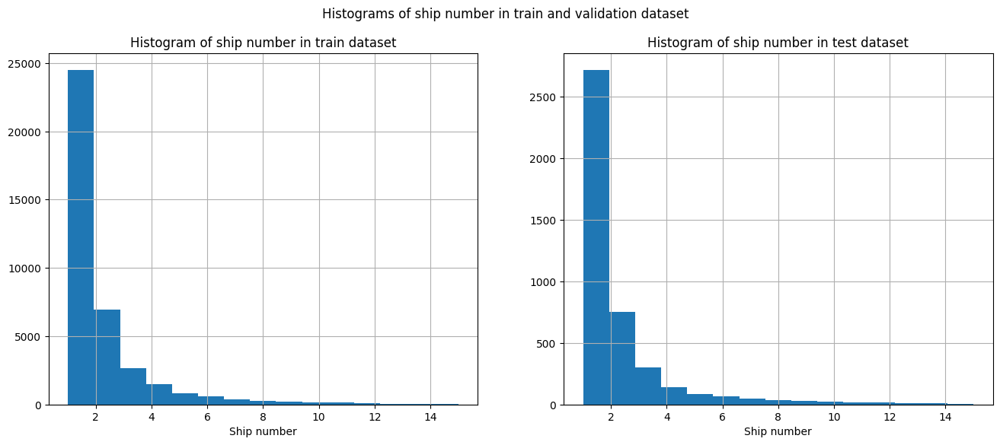

In [11]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

train_df['counts'].hist(bins=train_df['counts'].max(), ax=axes[0])
val_df['counts'].hist(bins=val_df['counts'].max(), ax=axes[1])

axes[0].set_title('Histogram of ship number in train dataset')
axes[0].set_xlabel('Ship number')
axes[1].set_title('Histogram of ship number in test dataset')
axes[1].set_xlabel('Ship number')

fig.suptitle('Histograms of ship number in train and validation dataset')

Ships number is distributed evenly evenly train and validation datasets

Text(0.5, 0.98, "The images that don't contain the ships")

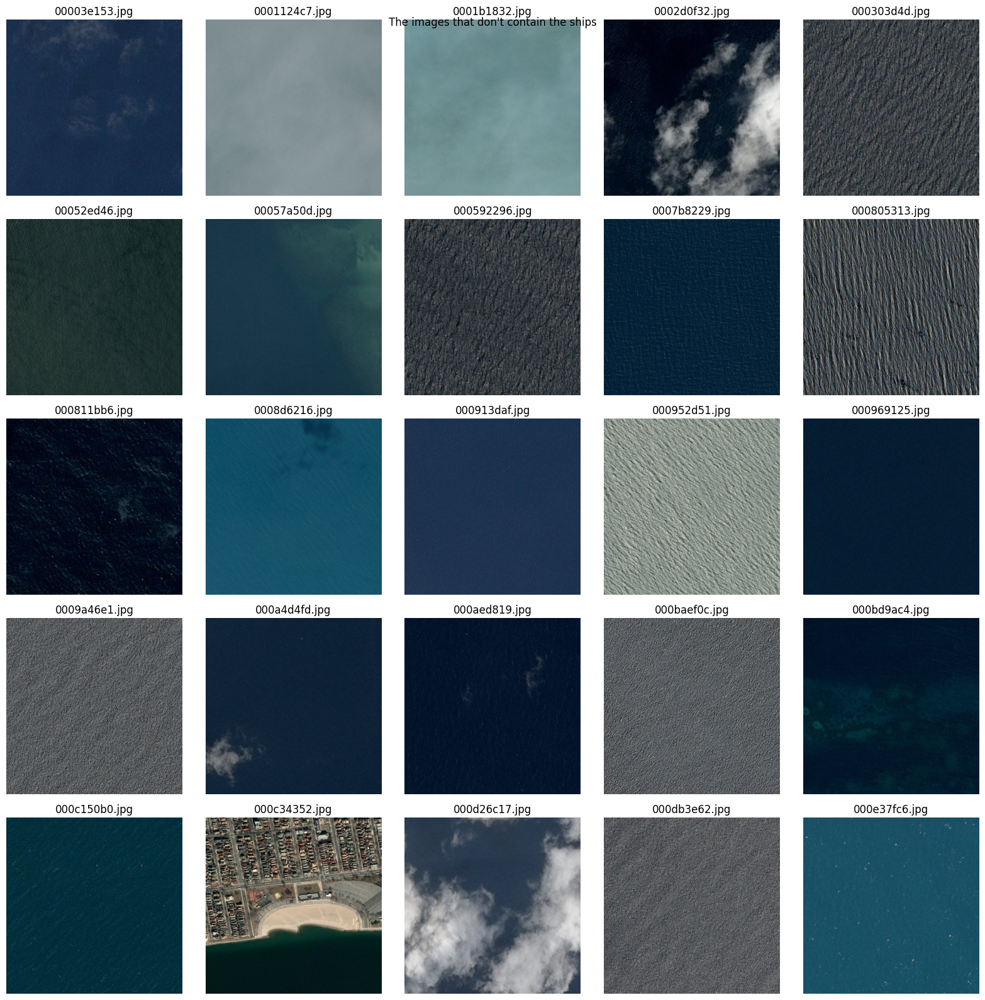

In [12]:
# Plotting the images without the ships

rows, cols = 5, 5
fig, axes = plt.subplots(rows, cols, figsize=(16, 16))

k = 0

for i in range(rows):
    for j in range(cols):
        img_path = os.path.join(TRAIN_DIR, noships_df['ImageId'].unique()[k])
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[i, j].imshow(img)
        axes[i, j].axis('off')
        axes[i, j].set_title(img_path.split('/')[-1])
        k += 1

fig.tight_layout()
fig.suptitle('The images that don\'t contain the ships')

Text(0.5, 0.98, 'The images that contain the ships and their masks')

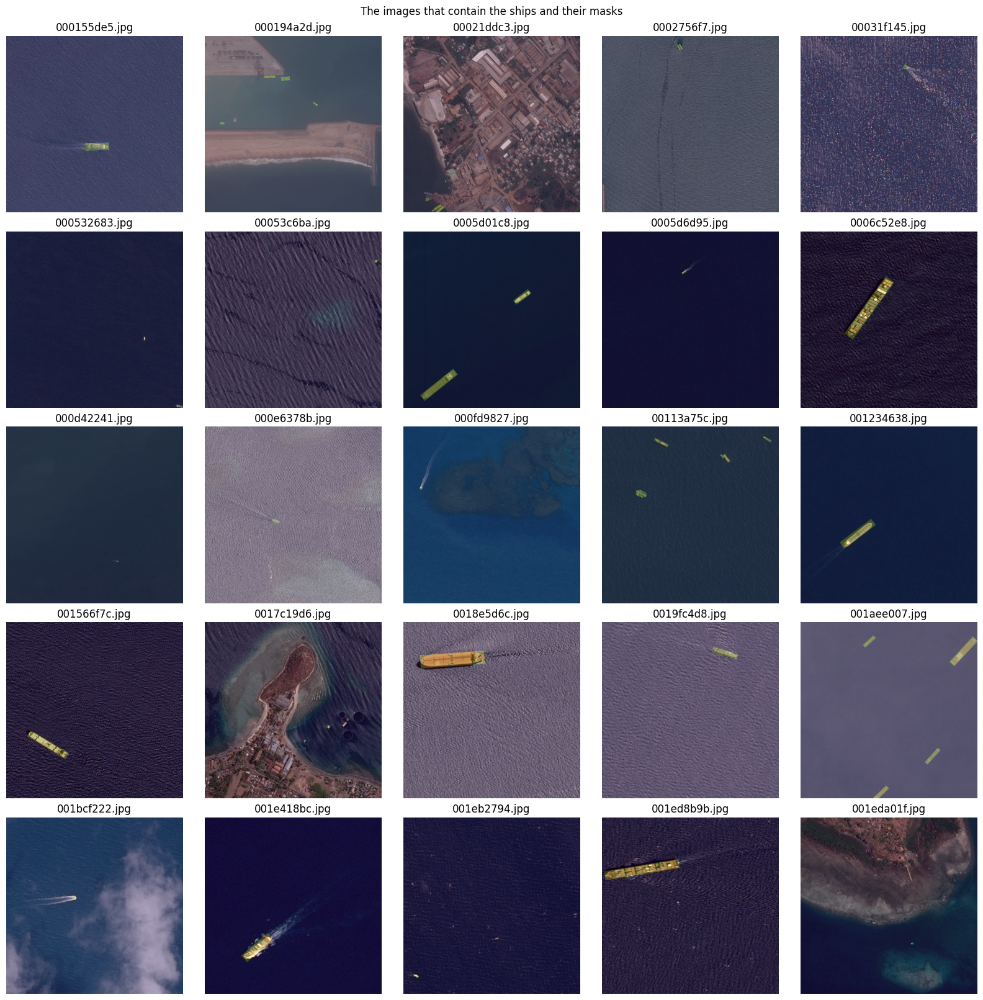

In [13]:
# Plotting the images with the ships

rows, cols = 5, 5
fig, axes = plt.subplots(rows, cols, figsize=(16, 16), constrained_layout=True)

k = 0

for i in range(rows):
    for j in range(cols):
        img_path = os.path.join(TRAIN_DIR, ships_df['ImageId'][k])
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[i, j].imshow(img)
        
        masks = rle_decode(ships_df['EncodedPixels'][k])
        
        axes[i, j].imshow(masks, alpha=.25)
        axes[i, j].axis('off')
        axes[i, j].set_title(img_path.split('/')[-1])
        
        k += 1
        
fig.suptitle('The images that contain the ships and their masks')

# **Model development**

We need to write own data augmentation because we need to apply them to both image and mask

In [14]:
def clip(img, dtype, maxval):
    return np.clip(img, 0, maxval).astype(dtype)

class DualCompose:
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, x, mask=None):
        for t in self.transforms:
            x, mask = t(x, mask)
        return x, mask


class VerticalFlip:
    def __init__(self, prob=0.5):
        self.prob = prob

    def __call__(self, img, mask=None):
        if random.random() < self.prob:
            img = cv2.flip(img, 0)
            if mask is not None:
                mask = cv2.flip(mask, 0)
        return img, mask


class HorizontalFlip:
    def __init__(self, prob=0.5):
        self.prob = prob

    def __call__(self, img, mask=None):
        if random.random() < self.prob:
            img = cv2.flip(img, 1)
            if mask is not None:
                mask = cv2.flip(mask, 1)
        return img, mask

class RandomCrop:
    def __init__(self, size):
        self.h = size[0]
        self.w = size[1]

    def __call__(self, img, mask=None):
        height, width, _ = img.shape

        h_start = np.random.randint(0, height - self.h)
        w_start = np.random.randint(0, width - self.w)

        img = img[h_start: h_start + self.h, w_start: w_start + self.w,:]

        assert img.shape[0] == self.h
        assert img.shape[1] == self.w

        if mask is not None:
            if mask.ndim == 2:
                mask = np.expand_dims(mask, axis=2)
            mask = mask[h_start: h_start + self.h, w_start: w_start + self.w,:]

        return img, mask

class CenterCrop:
    def __init__(self, size):
        self.height = size[0]
        self.width = size[1]

    def __call__(self, img, mask=None):
        h, w, c = img.shape
        dy = (h - self.height) // 2
        dx = (w - self.width) // 2
        y1 = dy
        y2 = y1 + self.height
        x1 = dx
        x2 = x1 + self.width
        img = img[y1:y2, x1:x2,:]
        if mask is not None:
            if mask.ndim == 2:
                mask = np.expand_dims(mask, axis=2)
            mask = mask[y1:y2, x1:x2,:]

        return img, mask

In [15]:
transforms = {
    'train': DualCompose([
        HorizontalFlip(.25),
        VerticalFlip(.25), 
        RandomCrop((256,256,3))
    ]),
    'val': DualCompose([
        CenterCrop((512,512,3))
    ])
}

In [16]:
class ShipDataset(Dataset):
    def __init__(self, root_dir: str, df: pd.DataFrame, mode: str = 'train', transforms=None):
        self.root_dir = root_dir
        self.mode = mode
        self.df = df
        
        self.img_list = self.df['ImageId'].unique()
        
        self.transforms = transforms
        self.posttransform = T.Compose([
            T.ToImage(),
            T.ToDtype(torch.float32, scale=True),
            T.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)  # use mean and std from ImageNet 
        ]) # here we just converting to tensor and normalizing the image
        
    def __getitem__(self, idx):
        img_name = self.img_list[idx]
        img_path = os.path.join(self.root_dir, img_name)
        
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        if self.mode == 'test':
            return self.posttransform(img), str(img_path)
        
        encoded_mask = self.df[self.df['ImageId'] == self.img_list[idx]]['EncodedPixels'].values[0]
        mask = rle_decode(encoded_mask)
        
        if self.transforms is not None:
            img, mask = self.transforms(img, mask)
        
        return self.posttransform(img), torch.from_numpy(np.moveaxis(mask, -1, 0)).float()
        
        
    def __len__(self) -> int:
        return len(self.img_list)

In [17]:
# computing dice and jaccard
def compute_metrics(pred, true, batch_size=16, threshold=0.5):
    pred = pred.view(batch_size, -1)
    true = true.view(batch_size, -1)
    
    pred = (pred > threshold).float()
    true = (true > threshold).float()
    
    pred_sum = pred.sum(-1)
    true_sum = true.sum(-1)
    
    neg_index = torch.nonzero(true_sum == 0)
    pos_index = torch.nonzero(true_sum >= 1)
    
    dice_neg = (pred_sum == 0).float()
    dice_pos = 2 * ((pred * true).sum(-1)) / ((pred + true).sum(-1))
    
    dice_neg = dice_neg[neg_index]
    dice_pos = dice_pos[pos_index]
    
    dice = torch.cat([dice_pos, dice_neg])
    jaccard = dice / (2 - dice)
    
    return dice, jaccard
    
class metrics:
    def __init__(self, batch_size=16, threshold=0.5):
        self.threshold = threshold
        self.batchsize = batch_size
        self.dice = []
        self.jaccard = []
    def collect(self, pred, true):
        pred = torch.sigmoid(pred)
        dice, jaccard = compute_metrics(pred, true, batch_size=self.batchsize, threshold=self.threshold)
        self.dice.extend(dice)
        self.jaccard.extend(jaccard)
    def get(self):
        dice = np.nanmean(self.dice)
        jaccard = np.nanmean(self.jaccard)
        return dice, jaccard
    
class BCEDiceWithLogitsLoss(nn.Module):
    def __init__(self, dice_weight=1, smooth=1):
        super().__init__()
        self.bce = nn.BCEWithLogitsLoss()
        self.dice_weight = dice_weight
        self.smooth = smooth
        
    def __call__(self, outputs, targets):
        if outputs.size() != targets.size():
            raise ValueError("size mismatch, {} != {}".format(outputs.size(), targets.size()))
            
        loss = self.bce(outputs, targets)

        targets = (targets == 1.0).float()
        targets = targets.view(-1)
        outputs = F.sigmoid(outputs)
        outputs = outputs.view(-1)

        intersection = (outputs * targets).sum()
        dice = 2.0 * (intersection + self.smooth)  / (targets.sum() + outputs.sum() + self.smooth)
        
        loss -= self.dice_weight * torch.log(dice) # try with 1- dice

        return loss

<img src="https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/u-net-architecture.png" alt="unet architecture" />

<center>Architecture of UNet</center>

In [18]:
# Loading pretrained Unet
model = smp.Unet("resnet34", encoder_weights="imagenet", activation=None).to(DEVICE)

# defining hyperparameters
TRAIN_BATCH_SIZE = 16
VAL_BATCH_SIZE = 4
TEST_BATCH_SIZE = 2

LR = 1e-4
NUM_EPOCHS = 3
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=LR)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 201MB/s] 


In [19]:
# creating dataset and dataloaders for train, validation and test images
train_dataset = ShipDataset(TRAIN_DIR, train_df, 'train', transforms['train'])
val_dataset = ShipDataset(TRAIN_DIR, val_df, 'val', transforms['val'])

train_loader = DataLoader(dataset=train_dataset, shuffle=True, batch_size=TRAIN_BATCH_SIZE, num_workers=0)
val_loader = DataLoader(dataset=val_dataset, shuffle=True, batch_size=VAL_BATCH_SIZE, num_workers=0)

test_list_imgs = os.listdir(TEST_DIR)

print(f'{len(test_list_imgs)} test images')

test_df = pd.DataFrame({
    'ImageId': test_list_imgs,
    'EncodedPixels': None
})


test_dataset = ShipDataset(TEST_DIR, test_df, 'test', None)
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=TEST_BATCH_SIZE, num_workers=0)

15606 test images


# **Training**

In [20]:
def train(
    model: nn.Module, 
    criterion: nn.Module, 
    train_loader: DataLoader, 
    valid_loader: DataLoader, 
    optimizer: nn.Module,
    train_batch_size: int = 16, 
    val_batch_size: int = 4, 
    n_epochs: int = 1, 
    fold: int = 1, 
    device: torch.device = 'cpu'
):
    model_path = Path(f'model_{fold}.pt')
    
    if model_path.exists():
        state = torch.load(str(model_path))
        epoch = state['epoch']
        step = state['step']
        model.load_state_dict(state['model'])
        print(f'Restored model, epoch {epoch}, step {step}')
    else:
        epoch = 1
        step = 0

    save = lambda ep: torch.save({
        'model': model.state_dict(),
        'epoch': ep,
        'step': step,
    }, str(model_path))

    report_each = 50
    log = open('train_{fold}.log'.format(fold=fold),'at', encoding='utf8')
    
    model = model.to(device)

    for epoch in range(epoch, n_epochs + 1):
        model.train()
        random.seed()
        train_loop = tqdm(total=len(train_loader) *  train_batch_size)
        train_loop.set_description(f'Epoch {epoch}')
        losses = []
        valid_metrics = metrics(batch_size=val_batch_size)  # for validation
        
        try:
            mean_loss = 0
            for i, (inputs, targets) in enumerate(train_loader):
                inputs, targets = inputs.to(device), targets.to(device)
                optimizer.zero_grad()
                outputs = model.forward(inputs)
                loss = criterion(outputs, targets)
                batch_size = inputs.size(0)
                loss.backward()
                optimizer.step()
                step += 1
                train_loop.update(batch_size)
                losses.append(loss.item())
                mean_loss = np.mean(losses[-report_each:])
                train_loop.set_postfix(loss='{:.5f}'.format(mean_loss))
                if i and i % report_each == 0:
                    write_event(log, step, loss=mean_loss)
            write_event(log, step, loss=mean_loss)
            train_loop.close()
            save(epoch + 1)
            
            # Validation
            comb_loss_metrics = validation(model, criterion, valid_loader, valid_metrics, device)
            write_event(log, step, **comb_loss_metrics)

        except KeyboardInterrupt:
            train_loop.close()
            print('Ctrl+C, saving snapshot')
            save(epoch)
            print('done.')
            return
        
def validation(
    model: nn.Module, 
    criterion: nn.Module, 
    valid_loader: DataLoader, 
    metrics, 
    device: torch.device
):
    print("Validation")
    
    losses = []
    model.eval()
    
    for inputs, targets in valid_loader:
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model.forward(inputs)
        loss = criterion(outputs, targets)
        losses.append(loss.item())
        metrics.collect(outputs.detach().cpu(), targets.detach().cpu()) # get metrics 
    
    valid_loss = np.mean(losses)  # float
    valid_dice, valid_jaccard = metrics.get() # float

    print('Valid loss: {:.5f}, Jaccard: {:.5f}, Dice: {:.5f}'.format(valid_loss, valid_jaccard, valid_dice))
    comb_loss_metrics = {'valid_loss': valid_loss, 'jaccard': valid_jaccard.item(), 'dice': valid_dice.item()}
    
    return comb_loss_metrics

def write_event(log, step: int, **data):
    data['step'] = step
    data['dt'] = datetime.now().isoformat()
    log.write(json.dumps(data, sort_keys=True))
    log.write('\n')
    log.flush()

In [21]:
def imshow_gt_out(img, mask_gt, mask_out):
    """
    Plots input image, ground truth and output mask
    """
    img = img.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = std * img + mean
    img = np.clip(img, 0, 1)

    mask_gt = mask_gt.numpy().transpose((1, 2, 0))
    mask_gt = np.clip(mask_gt, 0, 1)

    mask_out = mask_out.numpy().transpose((1, 2, 0))
    mask_out = np.clip(mask_out, 0, 1)

    fig, axs = plt.subplots(1,3, figsize=(10,30))
    axs[0].imshow(img)
    axs[0].axis('off')
    axs[0].set_title("Input image")
    axs[1].imshow(mask_gt)
    axs[1].axis('off')
    axs[1].set_title("Ground truth")
    axs[2].imshow(mask_out)
    axs[2].axis('off')
    axs[2].set_title("Model output")
    plt.subplots_adjust(wspace=0, hspace=0)

In [22]:
run_id = 1

train(
    model=model,
    criterion=criterion,
    optimizer=optimizer,
    train_loader=train_loader,
    valid_loader=val_loader,
    train_batch_size= TRAIN_BATCH_SIZE,
    val_batch_size=VAL_BATCH_SIZE,
    fold=run_id,
    n_epochs = NUM_EPOCHS,
    device=DEVICE
)

Epoch 1: 100%|█████████▉| 38508/38512 [19:20<00:00, 33.17it/s, loss=0.01342]


Validation
Valid loss: 0.01247, Jaccard: 0.58624, Dice: 0.64387


Epoch 2: 100%|█████████▉| 38508/38512 [14:18<00:00, 44.88it/s, loss=0.00727]


Validation
Valid loss: 0.00667, Jaccard: 0.60950, Dice: 0.65995


Epoch 3: 100%|█████████▉| 38508/38512 [14:25<00:00, 44.47it/s, loss=0.00605]


Validation
Valid loss: 0.00600, Jaccard: 0.62513, Dice: 0.67961


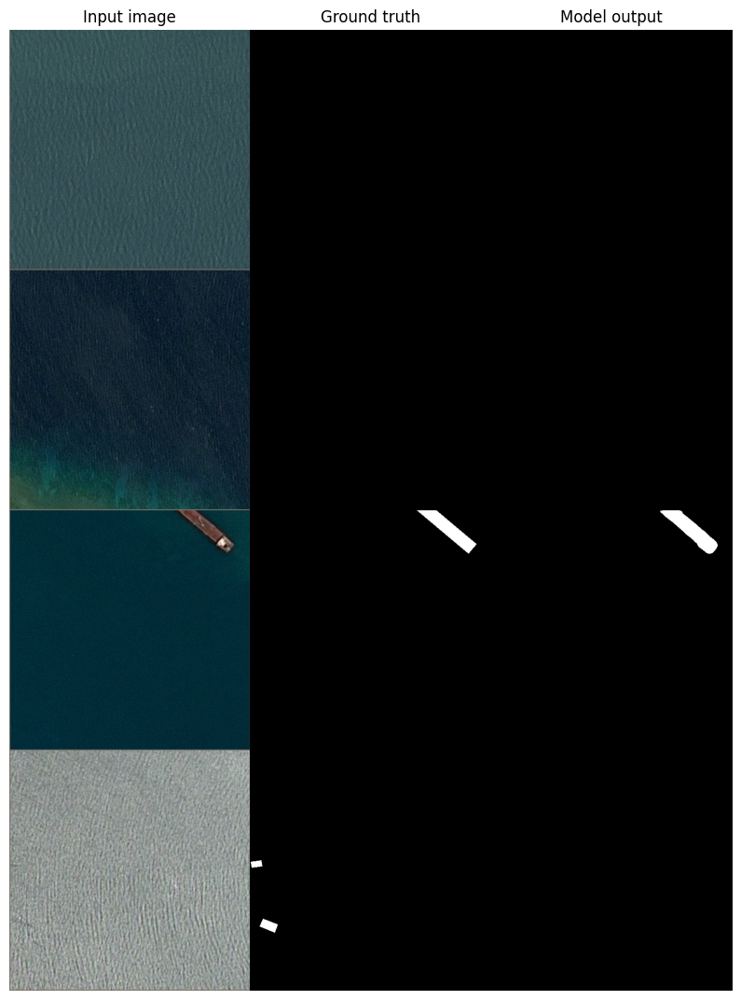

In [23]:
# Displaying how our model perform on validation dataset
images, ground_truth = next(iter(val_loader))
ground_truth = ground_truth.data.cpu()
images = images.to(DEVICE)
output = model(images)
output = ((output > 0).float()) * 255

images = images.data.cpu()
output = output.data.cpu()
imshow_gt_out(torchvision.utils.make_grid(images, nrow=1),torchvision.utils.make_grid(ground_truth, nrow=1), torchvision.utils.make_grid(output, nrow=1))
plt.show()

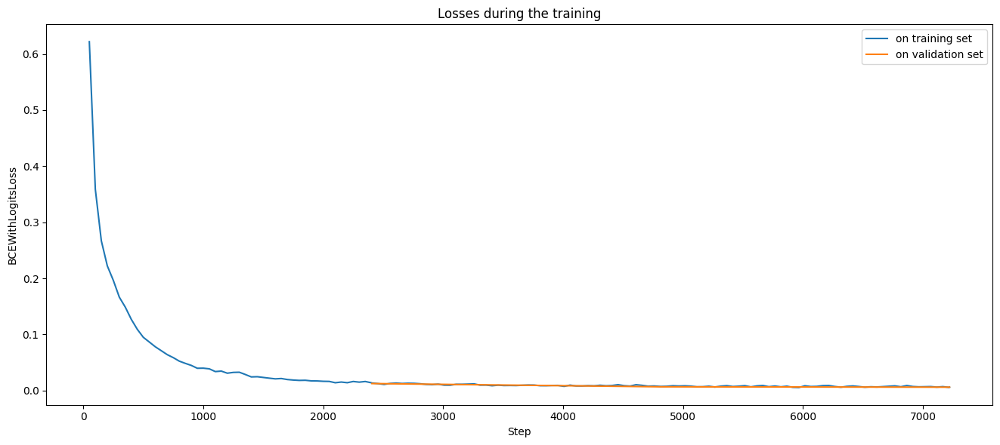

In [24]:
# Plot losses
log_file = f'train_{run_id}.log'
logs = pd.read_json(log_file, lines=True)

plt.figure(figsize=(26,6))
plt.subplot(1, 2, 1)
plt.plot(logs.step[logs.loss.notnull()],
            logs.loss[logs.loss.notnull()],
            label="on training set")

plt.plot(logs.step[logs.valid_loss.notnull()],
            logs.valid_loss[logs.valid_loss.notnull()],
            label = "on validation set")
         
plt.title('Losses during the training')
plt.xlabel('Step')
plt.ylabel('BCEWithLogitsLoss')
plt.legend()
plt.tight_layout()
plt.show();

# **Evaluation**

In [25]:
# We need to collect all test images and pass them through the model to get the masks
model.eval()

rows = []

test_loop = enumerate(tqdm(test_loader, desc='Test'))
for batch_idx, (imgs, names) in test_loop:
    imgs = imgs.to(DEVICE)
    
    with torch.no_grad():
        outputs = model(imgs)
        
    for i, img_name in enumerate(names):
        mask = F.sigmoid(outputs[i,0]).data.detach().cpu().numpy()
        
        seg_mask = binary_opening(mask > 0.5, disk(2))
        encoded_masks = multi_rle_encode(seg_mask)
        
        if len(encoded_masks) > 0:
            for encoded_mask in encoded_masks:
                rows += [{'ImageId': img_name.split('/')[-1], 'EncodedPixels': encoded_mask}]
        else:
            rows += [{'ImageId': img_name.split('/')[-1], 'EncodedPixels': None}]
            
model.train()
            
submission_df = pd.DataFrame(rows)[['ImageId', 'EncodedPixels']]
submission_df.to_csv('submission.csv', index=False)
submission_df.sample(15)

Test: 100%|██████████| 7803/7803 [15:34<00:00,  8.35it/s]


,ImageId,EncodedPixels
6719,e25e509d0.jpg,None
3752,cdb1f2ac1.jpg,None
14895,b9fce5ad3.jpg,None
3478,07a58cae1.jpg,None
5940,e9a5f1a51.jpg,None
6447,1c183bb56.jpg,None
13332,29aace51c.jpg,None
8257,d22c1b815.jpg,334726 6 335490 14 336257 16 337024 18 337791 ...
3380,8bb7ed4d2.jpg,None
10007,33663ef05.jpg,None


Text(0.5, 0.98, 'Output masks on the test images')

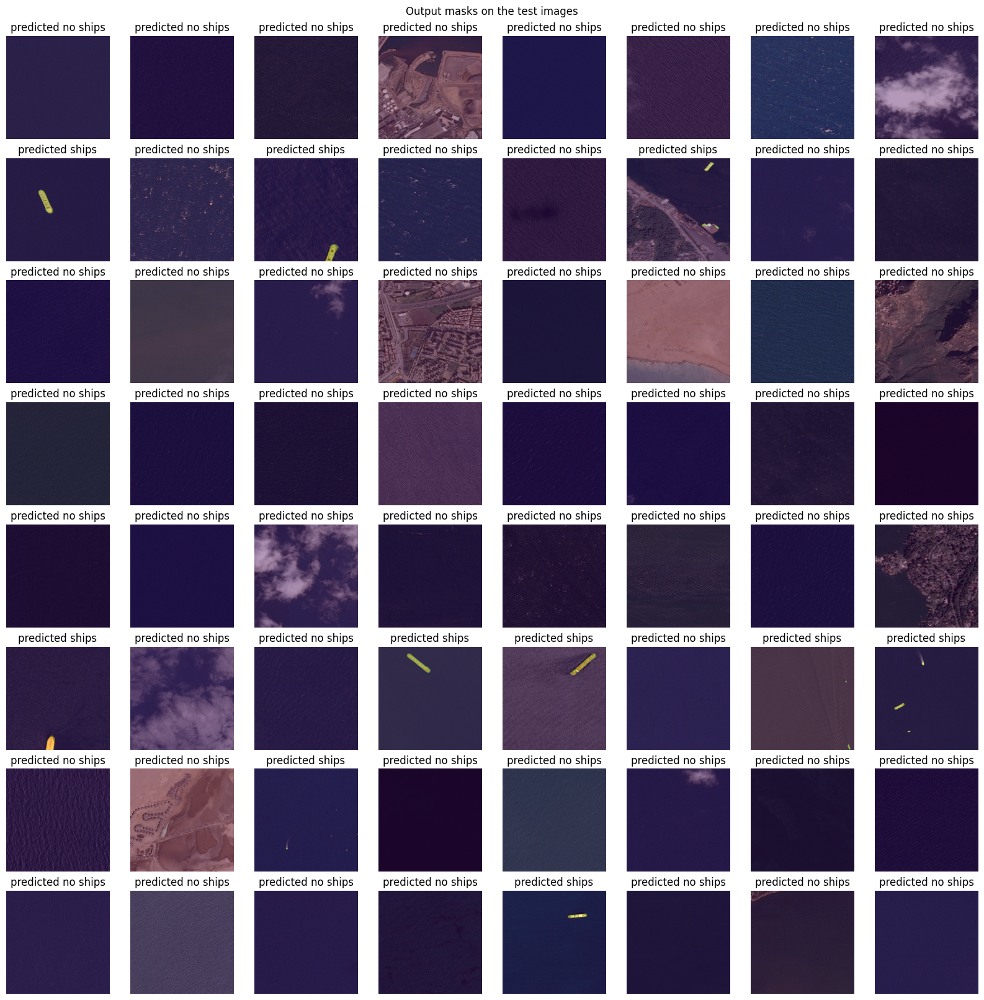

In [28]:
# Plotting the the images and output masks

rows, cols = 8, 8
fig, axes = plt.subplots(rows, cols, figsize=(16, 16), constrained_layout=True)

k = 0

temp_df =  submission_df.fillna('') \
    .groupby(['ImageId']) \
    .agg({'EncodedPixels': ' '.join}) \
    .reset_index()

for i in range(rows):
    for j in range(cols):
        img_path = os.path.join(TEST_DIR, temp_df['ImageId'][k])
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[i, j].imshow(img)
        
        masks = rle_decode(temp_df['EncodedPixels'][k])
        
        axes[i, j].imshow(masks, alpha=.4)
        axes[i, j].axis('off')
        
        
        if temp_df['EncodedPixels'][k] == '':
            axes[i, j].set_title(f"predicted no ships")
        else:
            axes[i, j].set_title(f"predicted ships")
            
        k += 1

fig.suptitle('Output masks on the test images')

We can also try to use Unet with deeper encoder (like Resnet 50, 101, 152), use gaussian, laplace filter (to smooth the images) and in such way we may get better results. But for now we get Dice = 0.67961, Jaccard = 0.62513, Kaggle submission private score = 0.81563, public score 0.67999